### Construct Simulators with SeuratV4 Datasets

In [1]:
import scanpy as sc
import pandas as pd

sc.set_figure_params(facecolor='white')


In [15]:
adata = sc.read_h5ad('../data/PBMC DATA/6/data.h5ad')

/home/xinzhu/anaconda3/lib/python3.9/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/xinzhu/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [17]:
metadata = pd.read_csv('../SeuratV4/metadata_seuratV4.txt',index_col=0,sep='\t')
metadata.index = [x+'_s6' for x in metadata.index]
adata.obs = pd.concat([adata.obs,metadata],axis=1)

In [14]:
adata.obs#['batch'].value_counts()


,batch,cell_type,label_l1,nCount_ADT,nFeature_ADT,nCount_RNA,nFeature_RNA,orig.ident,lane,donor,time,celltype.l1,celltype.l2,celltype.l3,Phase,nCount_SCT,nFeature_SCT
L1_AAACCCAAGAAACTCA_s6,P2,CD14 Mono,Mono,7430,221,10823,2915,P2_7,L1,P2,7,Mono,CD14 Mono,CD14 Mono,G1,6380,2548
L1_AAACCCAAGACATACA_s6,P1,CD4 TCM,CD4 T,5949,211,5864,1617,P1_7,L1,P1,7,CD4 T,CD4 TCM,CD4 TCM_1,G1,5693,1615
L1_AAACCCACAACTGGTT_s6,P4,CD8 Naive,CD8 T,6547,217,5067,1381,P4_3,L1,P4,3,CD8 T,CD8 Naive,CD8 Naive,S,5066,1379
L1_AAACCCACACGTACTA_s6,P3,NK,NK,3508,207,4786,1890,P3_7,L1,P3,7,NK,NK,NK_2,G1,4984,1889
L1_AAACCCACAGCATACT_s6,P4,CD8 Naive,CD8 T,6318,219,6505,1621,P4_7,L1,P4,7,CD8 T,CD8 Naive,CD8 Naive,G1,5854,1620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
E2L8_TTTGTTGGTCGTGATT_s6,P5,CD8 Naive,CD8 T,4089,200,9346,2201,P5_7,E2L8,P5,7,CD8 T,CD8 Naive,CD8 Naive,S,8231,2200
E2L8_TTTGTTGGTGTGCCTG_s6,P5,CD14 Mono,Mono,6869,213,9318,2938,P5_3,E2L8,P5,3,Mono,CD14 Mono,CD14 Mono,G1,8680,2938
E2L8_TTTGTTGGTTAGTTCG_s6,P8,B intermediate,B,4173,208,11619,3224,P8_0,E2L8,P8,0,B,B intermediate,B intermediate kappa,S,8555,3130
E2L8_TTTGTTGGTTGGCTAT_s6,P5,CD16 Mono,Mono,5979,221,15436,3999,P5_3,E2L8,P5,3,Mono,CD16 Mono,CD16 Mono,G1,8970,3533


In [266]:
donors = ['P8','P7','P1','P2']
subdata = adata[adata.obs['batch'].isin(donors)]

In [267]:
cts = ['CD4 TCM_1','CD4 TCM_3','MAIT','CD4 CTL','CD8 TEM_1','CD8 TEM_2','CD8 TEM_3','CD8 TEM_3','gdT_1','Treg Naive']
# cts = ['CD4 CTL','CD8 TEM','MAIT','CD4 TCM','CD4 TEM','Treg','gdT']
# subdata = subdata[subdata.obs['cell_type'].isin(cts)]
subdata = subdata[subdata.obs['celltype.l3'].isin(cts)]
# subdata = adata[adata.obs['cell_type'].isin(cts)]

In [ ]:
import random
import numpy as np

subset = subdata.obs['celltype.l3']=='CD8 TEM_2'
downsample = random.sample(range(sum(subset)),500)
sampleindex = subdata[subset].obs_names[downsample]
indices = np.concatenate([subdata[~subset].obs_names,sampleindex])
subdata = subdata[indices,:]

In [366]:
subrna = subdata[:,subdata.var['feature_types']=='Gene Expression']

### Data Pre-processing

In [245]:
def scanpypp(adata):
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True)
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    # sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
    # sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")
    sc.pp.highly_variable_genes(adata,min_mean=0.15,max_mean=2.5,min_disp=0.5)
    sc.pl.highly_variable_genes(adata)
    adata = adata[:,adata.var.highly_variable]
    sc.pp.scale(adata)
    sc.pp.pca(adata, n_comps=50)
    return adata

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


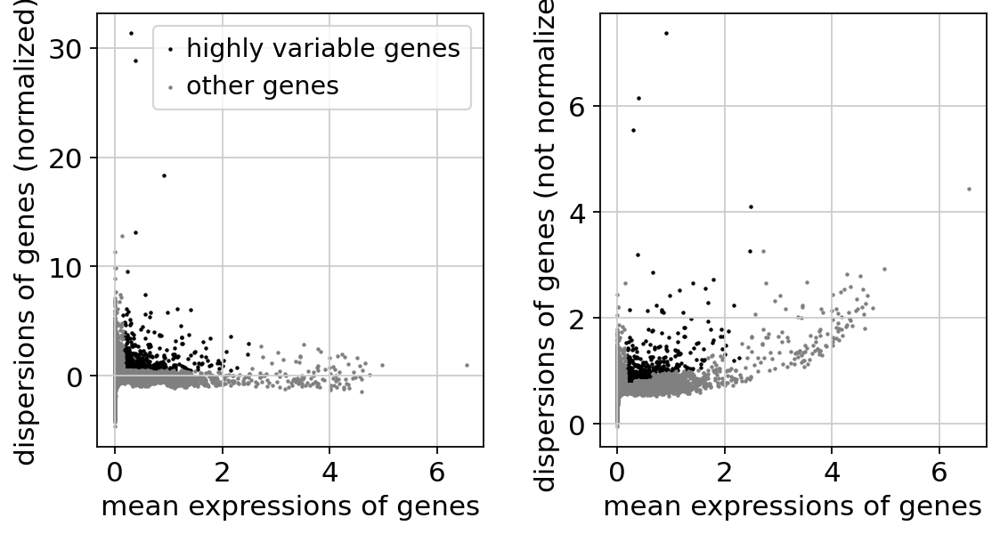

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [367]:
subrna = scanpypp(subrna)

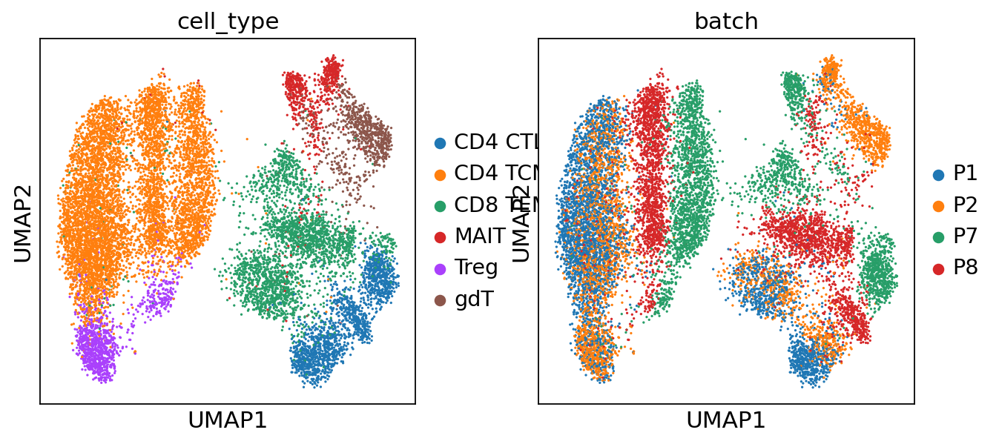

In [368]:
sc.pp.neighbors(subrna)
sc.tl.umap(subrna)
sc.pl.umap(subrna, color=['cell_type','batch'])

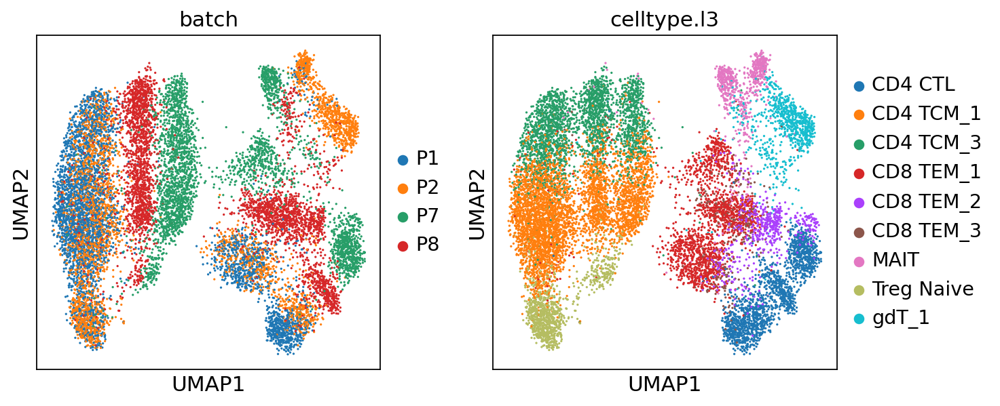

In [369]:
sc.pl.umap(subrna, color=['batch','celltype.l3'])

In [370]:
sc.external.pp.harmony_integrate(subrna, key='batch')
sc.pp.neighbors(subrna, n_neighbors=20, key_added='harmony',use_rep='X_pca_harmony')
sc.tl.umap(subrna, neighbors_key='harmony')

2025-04-15 16:17:16,092 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-15 16:17:24,609 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-15 16:17:24,687 - harmonypy - INFO - Iteration 1 of 10
2025-04-15 16:17:30,657 - harmonypy - INFO - Iteration 2 of 10
2025-04-15 16:17:36,577 - harmonypy - INFO - Iteration 3 of 10
2025-04-15 16:17:43,096 - harmonypy - INFO - Iteration 4 of 10
2025-04-15 16:17:49,911 - harmonypy - INFO - Converged after 4 iterations


In [373]:
sc.tl.leiden(subrna, resolution=0.5)

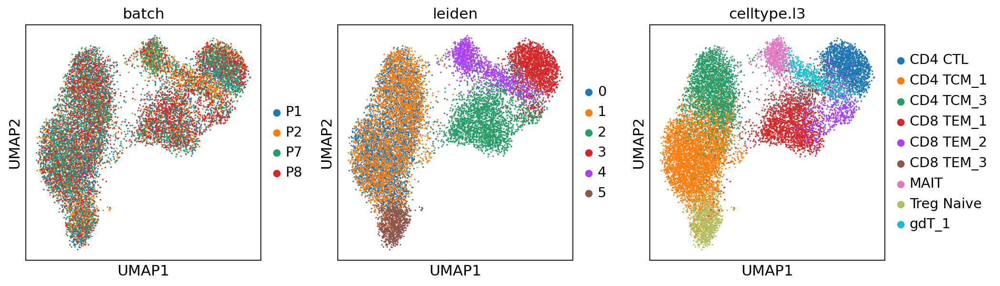

In [374]:
sc.pl.umap(subrna, color=['batch','leiden','celltype.l3'])

### Refine Cell Type Label

In [201]:
# subrna.obs['refine_ct'] = subrna.obs['refine_ct'].cat.add_categories(['CD4 TEM_3'])
subrna.obs['refine_ct'].loc[subrna.obs['celltype.l3']=='CD4 TEM_3'] = 'CD4 TEM_3'
# subrna.obs['refine_ct'].value_counts()

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


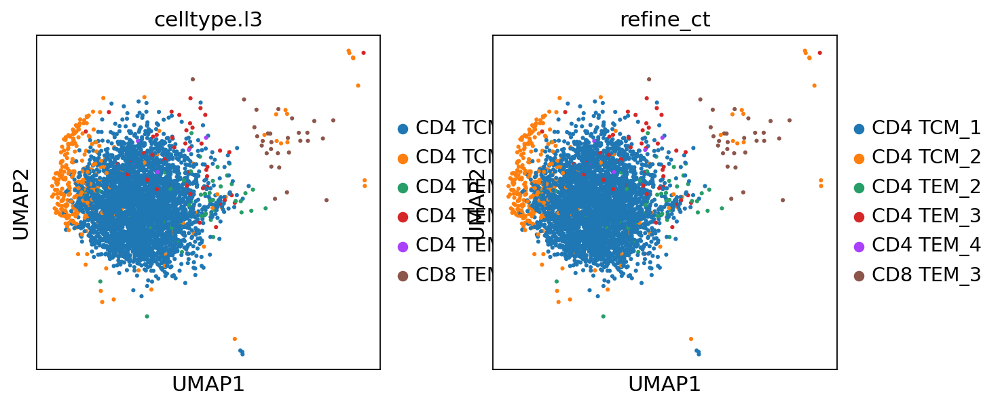

In [177]:
sc.pl.umap(subrna[subrna.obs['refine_ct'].isin(['CD4 TCM_1','CD4 TCM_2','CD4 TEM_4','CD4 TEM_2','CD4 TEM_3','CD8 TEM_3'])],color=['celltype.l3','refine_ct'])

In [196]:
# subtype = adata[adata.obs['cell_type']=='gdT'].copy()
# subtype = subrna[subrna.obs['cell_type']=='gdT'].copy()
subtype = subrna[subrna.obs['leiden']=='0'].copy()

In [197]:
sc.pp.pca(subtype)
sc.external.pp.harmony_integrate(subtype, key='batch')
sc.pp.neighbors(subtype, n_neighbors=10, key_added='harmony',use_rep='X_pca_harmony')
sc.tl.umap(subtype, neighbors_key='harmony')

2025-04-10 19:07:20,824 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-10 19:07:34,055 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-10 19:07:34,133 - harmonypy - INFO - Iteration 1 of 10
2025-04-10 19:07:37,913 - harmonypy - INFO - Iteration 2 of 10
2025-04-10 19:07:41,656 - harmonypy - INFO - Converged after 2 iterations


In [198]:
# subtype.obs['leiden'] = None
sc.tl.leiden(subtype, resolution=0.3,neighbors_key='harmony')
# sc.tl.louvain(subtype)

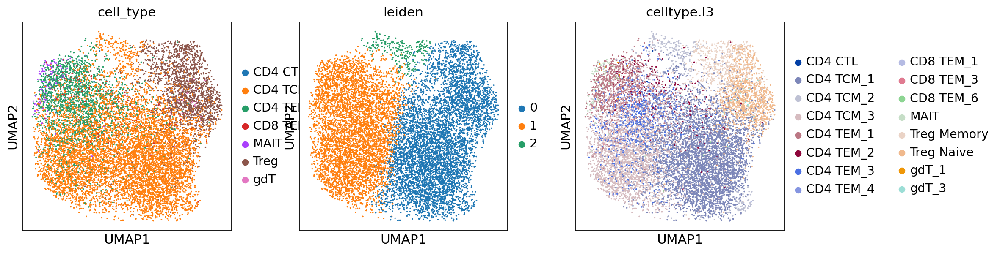

In [199]:
# sc.pp.neighbors(subtype, n_neighbors=20)
# sc.tl.umap(subtype)
sc.pl.umap(subtype, color=['cell_type','leiden','celltype.l3'])

In [169]:
# subtype.obs['refine'] = subtype.obs['celltype.l3']
subtype.obs['refine'].loc[subtype.obs['leiden']=='0'] = 'CD8 TEM_6'


In [120]:
subsub = subtype[subtype.obs['leiden']=='4']

In [121]:
sc.pp.scale(subsub)
sc.pp.pca(subsub)
sc.external.pp.harmony_integrate(subsub, key='batch')
sc.pp.neighbors(subsub, n_neighbors=20, key_added='harmony',use_rep='X_pca_harmony')
sc.tl.umap(subsub, neighbors_key='harmony')

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
2025-04-10 18:17:15,876 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-10 18:17:17,971 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-10 18:17:17,991 - harmonypy - INFO - Iteration 1 of 10
2025-04-10 18:17:18,415 - harmonypy - INFO - Iteration 2 of 10
2025-04-10 18:17:18,841 - harmonypy - INFO - Iteration 3 of 10
2025-04-10 18:17:19,206 - harmonypy - INFO - Iteration 4 of 10
2025-04-10 18:17:19,671 - harmonypy - INFO - Iteration 5 of 10
2025-04-10 18:17:20,093 - harmonypy - INFO - Iteration 6 of 10
2025-04-10 18:17:20,443 - harmonypy - INFO - Iteration 7 of 10
2025-04-10 18:17:20,731 - harmonypy - INFO - Iteration 8 of 10
2025-04-10 18:17:21,020 - harmonypy - INFO - Iteration 9 of 10
2025-04-10 18:17:21,255 - harmonypy - INFO - Iteration 10 of 10
2025-04-10 18:17:2

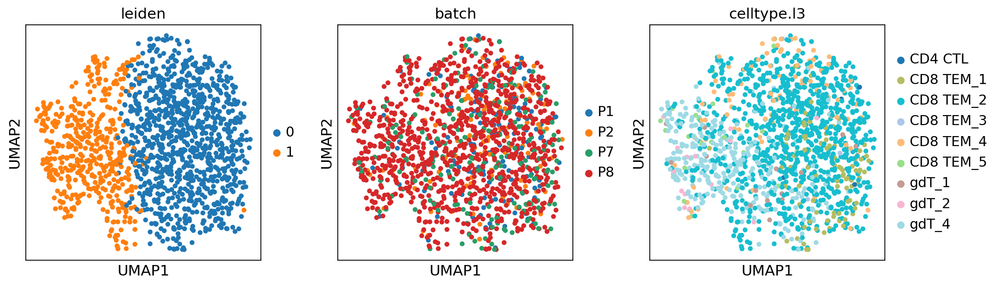

In [130]:
# sc.tl.leiden(subsub,resolution=0.5,neighbors_key='harmony')
sc.pl.umap(subsub, color=['leiden','batch','celltype.l3'])

In [107]:
subsub = subsub[subsub.obs['celltype.l3']!='CD8 TEM_1']

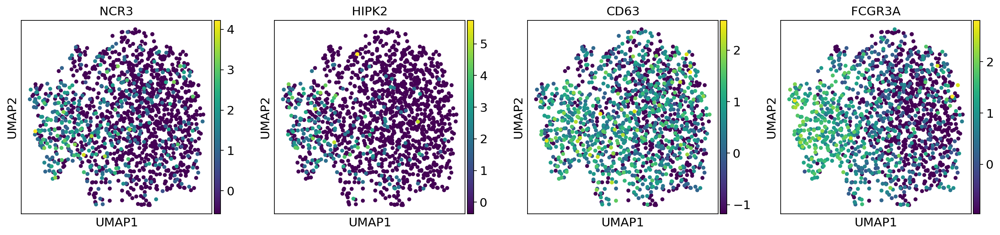

In [139]:
sc.pl.umap(subsub,color=['NCR3','HIPK2','CD63','FCGR3A'])

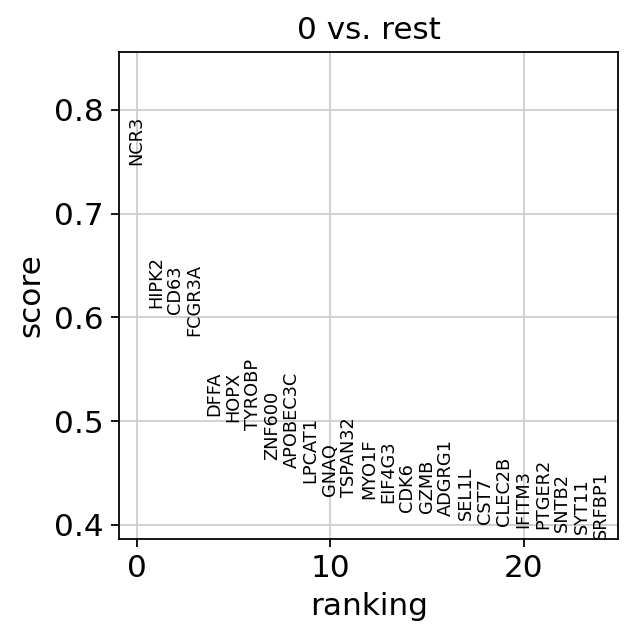

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


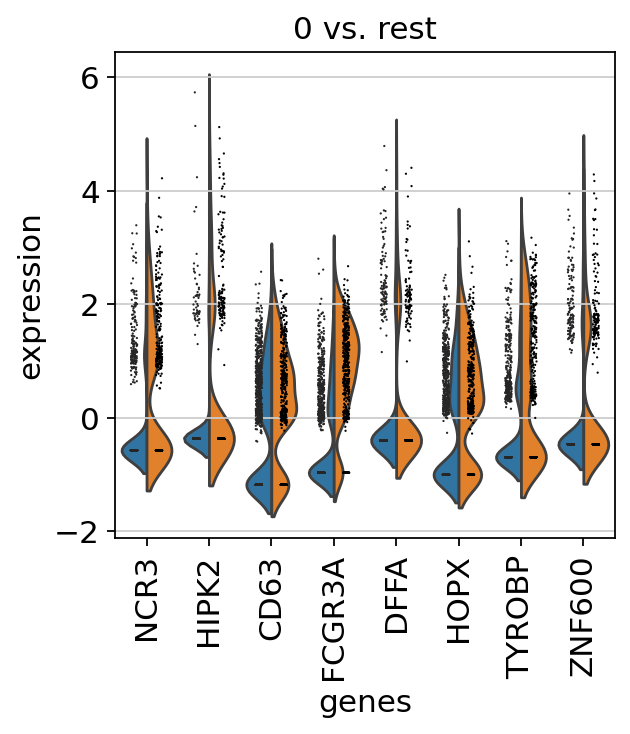

In [123]:
sc.tl.rank_genes_groups(subsub, "leiden", method="logreg", max_iter=1000)
sc.pl.rank_genes_groups(subsub, n_genes=25, sharey=False)
sc.pl.rank_genes_groups_violin(subsub, n_genes=8)

In [125]:
subadt = subdata[subsub.obs_names,subdata.var['feature_types']=='Antibody Capture']
subadt.obsm['X_umap'] = subsub.obsm['X_umap']


/tmp/ipykernel_73775/1956451467.py:2: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  subadt.obsm['X_umap'] = subsub.obsm['X_umap']


/tmp/ipykernel_73775/322324662.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subadt.obs['temp'].loc[subsub.obs_names] = subsub.obs['leiden']
/home/xinzhu/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


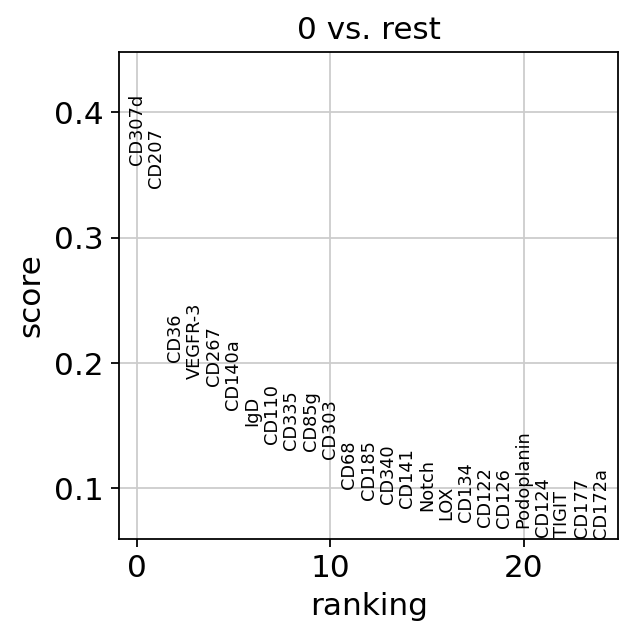

In [126]:
subadt.obs['temp'] = None
subadt.obs['temp'].loc[subsub.obs_names] = subsub.obs['leiden']
sc.tl.rank_genes_groups(subadt, "temp", method="logreg", max_iter=1000, groups=['0','1'])
sc.pl.rank_genes_groups(subadt, n_genes=25, sharey=False)

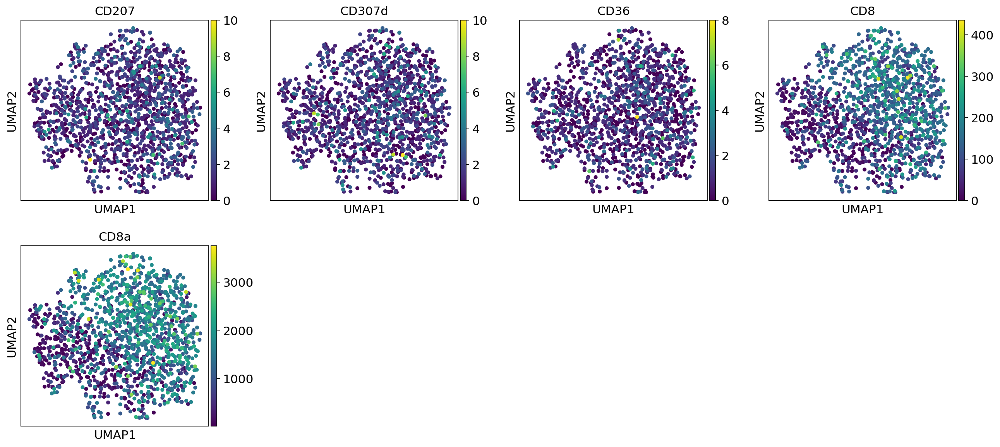

In [141]:
sc.pl.umap(subadt[subsub.obs_names],color=['CD207','CD307d','CD36','CD8','CD8a'])

In [142]:
subtype.obs['refine'].loc[subsub[subsub.obs['leiden']=='1'].obs_names] = 'gdT_4'

In [170]:
# subrna.obs['refine'] = None
# subrna.obs['refine'] = subrna.obs['refine'].cat.add_categories(list(set(subtype.obs['refine'].cat.categories)-set(subrna.obs['refine'].cat.categories)))
subrna.obs['refine_ct'] = subrna.obs['refine_ct'].astype(str)
subrna.obs['refine_ct'].loc[subtype.obs_names] = subtype.obs['refine']

/tmp/ipykernel_73775/2801294327.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subrna.obs['refine_ct'].loc[subtype.obs_names] = subtype.obs['refine']


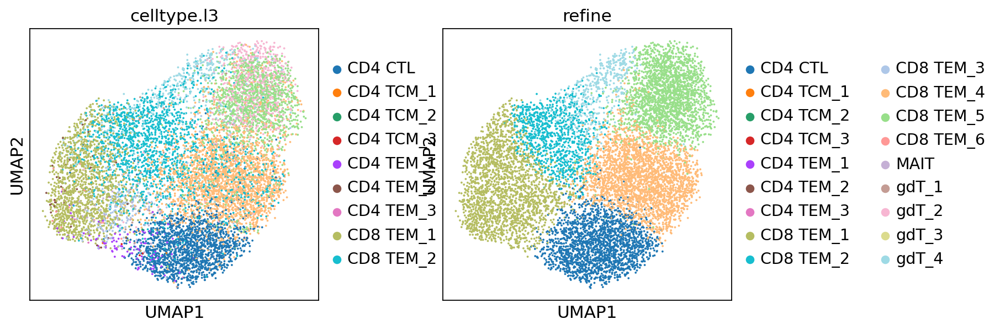

In [152]:
sc.pl.umap(subtype,color=['celltype.l3','refine'],wspace=0.3)

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/xinzhu/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


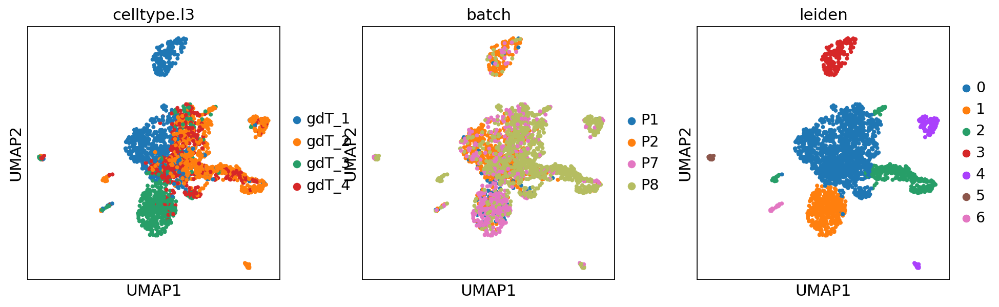

In [40]:
sc.pl.umap(subtype[subtype.obs['batch'].isin(['P1','P2','P7','P8'])], color=['celltype.l3','batch','leiden'])

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


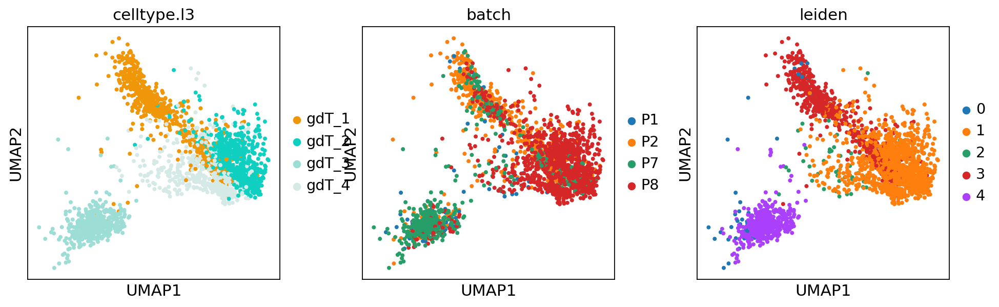

In [41]:
sc.pl.umap(subrna[subrna.obs['cell_type']=='gdT'], color=['celltype.l3','batch','leiden'])

### Save Real Simulation Data to Format

In [275]:
# subdata.var['index_form'] = pd.Categorical(subdata.var['index_form'])
# subdata.var['index_form'] = subdata.var['index_form'].cat.remove_unused_categories()
subdata.var = subdata.var.drop('index_form',axis=1)

/home/xinzhu/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [276]:
subdata.write_h5ad('../data/RealSimulation/set2/data.h5ad')

In [196]:
for i in range(len(donors)):
    subdata[subdata.obs['batch']==donors[i]].write_h5ad('../data/RealSimulation/set1/'+str(i+1)+'.h5ad')

In [358]:
len(list(subdata[subdata.obs['celltype.l3']=='CD8 TEM_2'][downsample,:].obs_names)+list(subdata[subdata.obs['celltype.l3']!='CD8 TEM_2'].obs_names))

13611

In [364]:
sub[downsample,:]

View of AnnData object with n_obs × n_vars = 500 × 33766
    obs: 'batch', 'cell_type', 'label_l1', 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT'
    var: 'gene_ids', 'feature_types', 'raw'

In [98]:
subadt = subdata[:,subdata.var['feature_types']=='Antibody Capture'].copy()
# subadt[subadt.obs['batch']=='P1',['CD4-2','CD45RO','CD25']].X = 0
# subadt[subadt.obs['batch']=='P2',['CD8','CD27','CD28']].X = 0
# subadt[subadt.obs['batch']=='P3',['CD45RO','CD8','CD16']].X = 0
# subadt[subadt.obs['batch']=='P4',['CD45RA','CD161','CD69']].X = 0

In [797]:
import random
mask,donor  = {},[1,2,7,8]
for i in donor:
    mask[i] = random.sample(range(228),20)
    subadt[subadt.obs['batch']=='P'+str(i),mask[i]].X = 0
mask

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


{1: [223,
  130,
  206,
  41,
  8,
  181,
  192,
  6,
  96,
  125,
  32,
  55,
  56,
  158,
  40,
  132,
  208,
  53,
  46,
  43],
 2: [52,
  139,
  97,
  83,
  137,
  93,
  184,
  191,
  201,
  159,
  181,
  19,
  17,
  25,
  27,
  86,
  60,
  168,
  178,
  82],
 7: [152,
  217,
  179,
  135,
  227,
  164,
  37,
  176,
  162,
  187,
  19,
  103,
  150,
  23,
  86,
  48,
  197,
  192,
  171,
  208],
 8: [199,
  220,
  149,
  11,
  124,
  95,
  63,
  111,
  175,
  90,
  212,
  213,
  183,
  30,
  56,
  142,
  22,
  37,
  132,
  145]}

In [804]:
subadt[subadt.obs['batch']=='P8',183].X.sum()

0.0

In [805]:
mosaicdata = subdata[:,subdata.var['feature_types']!='Antibody Capture']
mosaicdata = sc.concat([mosaicdata,subadt],axis=1)
# mosaicdata[:,mosaicdata.var['feature_types']=='Antibody Capture'] = subadt

/home/xinzhu/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [806]:
mosaicdata.obs = subdata.obs

In [807]:
mosaicdata.write_h5ad('../data/RealSimulation/set1_mosaic2/data.h5ad')

### CITE-pool Performance

In [45]:
import scanpy as sc
subrna = sc.read_h5ad('../data/RealSimulation/set1/1_pp.h5ad')
# subrna.uns['pred_colors'] = 'blue'
# sc.settings.set_figure_params(facecolor='white')

In [323]:
import pandas as pd
subrna.obs['pred'] = None
for i in range(1,5):
    pred = pd.read_csv('../output/RealSimulation/set2/1/'+str(i)+'/leaf_labels.csv',index_col=0)
    subrna.obs['pred'].loc[pred.index] = pred['Label']


/tmp/ipykernel_73775/2327351311.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subrna.obs['pred'].loc[pred.index] = pred['Label']
/tmp/ipykernel_73775/2327351311.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subrna.obs['pred'].loc[pred.index] = pred['Label']
/tmp/ipykernel_73775/2327351311.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subrna.obs['pred'].loc[pred.index] = pred['Label']
/tmp/ipykernel_73775/2327351311.py

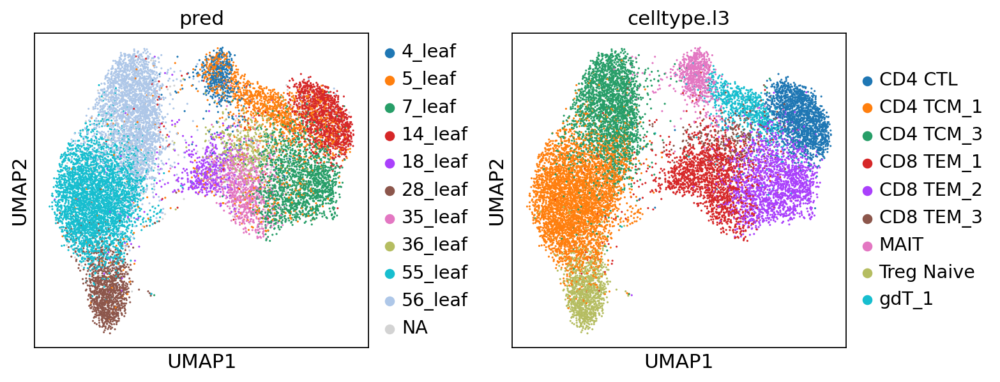

In [324]:
sc.pl.umap(subrna, color=['pred', 'celltype.l3'], wspace=0.3) # 

In [ ]:
cts = ['CD4 TCM_1','CD4 TCM_3','MAIT','CD4 CTL','CD8 TEM_1','CD8 TEM_2','CD8 TEM_3','CD8 TEM_3','gdT_1']

In [375]:
# sc.pl.umap(subrna[subrna.obs['pred'].isin(['36_leaf'])], color=['batch','pred', 'celltype.l3'])
sc.pl.umap(subrna[subrna.obs['cell_type'].isin(['CD8 TEM'])], color=['pred', 'celltype.l3' ,'batch'])
# sc.pl.umap(subrna[subrna.obs['batch'].isin(['P2'])], color=['pred', 'cell_type','batch'])

KeyError: 'Could not find key pred in .var_names or .obs.columns.'

<Figure size 1159.2x320 with 0 Axes>

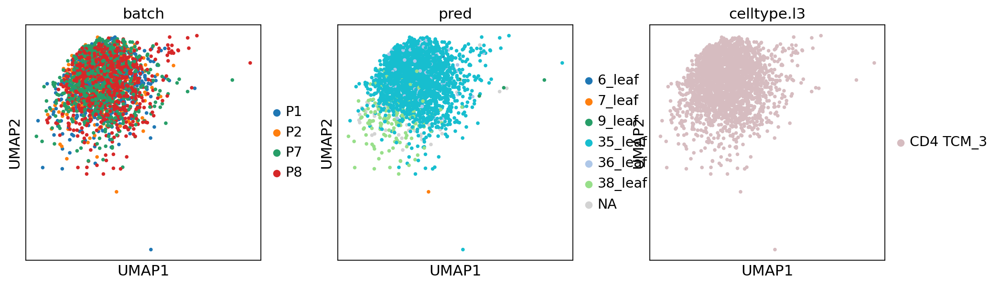

In [951]:
sc.pl.umap(subrna[subrna.obs['celltype.l3'].isin(['CD4 TCM_3','CD4 TEM_3'])], color=['batch','pred', 'celltype.l3'])

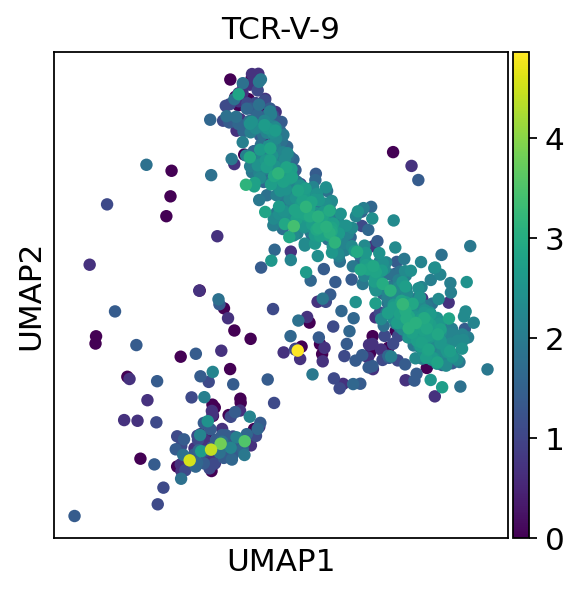

In [1028]:
# sc.pl.umap(subadt[subrna.obs['celltype.l3'].isin(['gdT_4'])], color=['CD8','CD8a','CD4'])
sc.pl.umap(subadt[subrna.obs['pred'].isin(['10_leaf'])], color=['TCR-V-9'])

In [326]:
# subrna[subrna.obs['pred'].isin(['20_leaf'])].obs['cell_type'].value_counts()
subrna[subrna.obs['celltype.l3'].isin(['CD8 TEM_3'])].obs['pred'].value_counts()

36_leaf    166
7_leaf      41
18_leaf     20
35_leaf      9
5_leaf       5
4_leaf       1
Name: pred, dtype: int64

In [99]:
# subrna.obsm['ADT'] = subdata[:,subdata.var['feature_types']=='Antibody Capture'].to_df()
# subrna.obsm['ADT']

subadt.obsm['X_umap'] = subrna.obsm['X_umap']
sc.pp.log1p(subadt)


In [328]:
subrna.var = subrna.var.drop('index_form',axis=1)
subrna.write_h5ad('../data/RealSimulation/2_pp.h5ad')

### CITEpool Embedding

In [278]:
import pickle
from Classifier.BTree import BTree

f = open('../output/RealSimulation/set1_/0/tree_retrain.pickle','rb')

tree = pickle.load(f)
queue, idxlist = [tree], [0]
# print(queue)

mapping = pd.DataFrame(index=subrna.var_names)
while len(queue)>0:
    node = queue.pop(0)
    ind = idxlist.pop(0)
    if node.key != ('leaf',):
        mapping[ind] = 0
        vars = mapping.index.intersection(node.artificial_w.index)
        mapping.loc[vars,ind] = node.artificial_w[vars]
        queue.append(node.left)
        queue.append(node.right)
        idxlist.append(2*ind+1)
        idxlist.append(2*ind+2)
    
mapping.to_csv('../output/RealSimulation/set1_/0/new_mapping.csv') 

ModuleNotFoundError: No module named 'BTree'

In [415]:
mapping = pd.read_csv('../output/RealSimulation/set1_fine/0/new_mapping.csv',index_col=0)
# mapping_values = mapping.values.astype(float) 
# subrna = sc.read_h5ad('../data/RealSimulation/set1/1_pp.h5ad')
subrna.obs['embedding'] = None


In [419]:
# subrna.obsm['embedding'] = subrna.X.dot(mapping)
subrna.obsm['embedding'] = subrna.X.dot(mapping_norm)
# subrna.obsm['embedding'] = subrna.X.dot(mapping_scale)

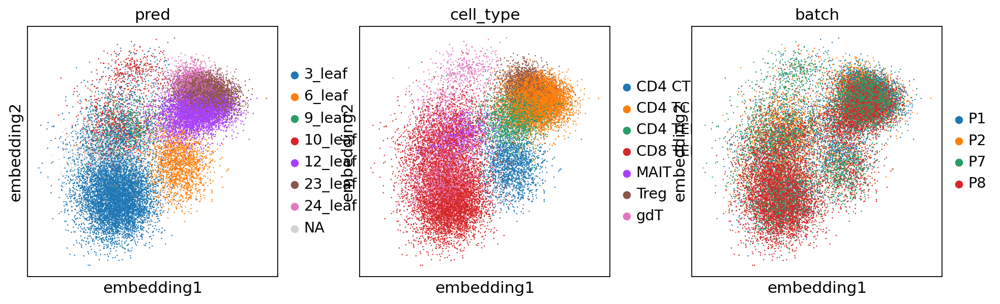

In [543]:
sc.pl.embedding(subrna, basis='embedding',dimensions=[0,1],color=['pred', 'cell_type','batch'])

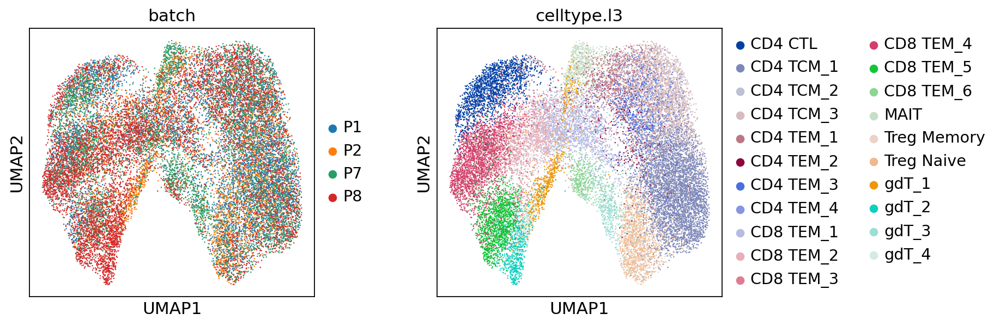

In [420]:
sc.pp.neighbors(subrna, n_neighbors=20, key_added='lda',use_rep='embedding')
adata_lda = subrna.copy()
sc.tl.umap(adata_lda,neighbors_key='lda')
sc.pl.umap(adata_lda,color=['batch', 'celltype.l3'],wspace=0.3)

In [418]:
## Normalize mapping
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
mapping_norm = pd.DataFrame(scaler.fit_transform(mapping), columns=mapping.columns)

In [287]:
mapping_norm.columns

Index(['0', '1', '2', '3', '4', '8', '18'], dtype='object')

In [335]:
import numpy as np
mapping_scale = mapping_norm.copy()
for i in mapping_norm.columns:
    t  = (np.log2(2*int(i)+1)+1)/10
    mapping_scale.loc[:,i] = mapping_norm.loc[:,i] * t
    print(i,t)

0 0.1
1 0.25849625007211563
2 0.3321928094887362
3 0.3807354922057604
6 0.4700439718141093
8 0.5087462841250339
13 0.5754887502163468
17 0.6129283016944966
27 0.678135971352466


### Evaluation Metric

In [203]:
from sklearn import metrics

methodlist = ['CITE-pool']
score_df = pd.DataFrame(columns=['ARI','AMI'],index=methodlist)
for id in methodlist:
    # true = pd.read_csv('./simulator_out/droplets_composition_'+id+'.csv', sep=',',index_col=0)
    # pred_cite = pd.read_csv('./output/'+id+'_rna/leaf_labels.csv',index_col=0)
    indices1 = subrna[subrna.obs['refine_ct'].astype(str)!='nan'].obs_names
    indices2 = subrna[subrna.obs['pred'].astype(str)!='nan'].obs_names
    indices = list(set(indices1)&set(indices2))
    true = subrna[indices,:].obs['refine_ct'].values
    pred = subrna[indices,:].obs['pred'].astype('str').values

    score_df.loc[id,'ARI'] = metrics.adjusted_rand_score(true, pred)
    score_df.loc[id,'AMI'] = metrics.adjusted_mutual_info_score(true, pred)

In [189]:
import numpy as np
indices = subrna[subrna.obs['refine_ct'].astype(str)!='nan']